### dataset preapreations

In [1]:
from google.colab import output
import os

In [2]:
!pip install gdown

In [3]:
!gdown "1IUB__JPaBj3XEtfeIVr5Tlg_SD5rwa05"
!gdown "1fy8dI-2dKPJprlZlZIB_XM0gh9LqL_Cn"
!gdown "1QxipseJnt1y5enieUUh16k22Vuhr7E6S"

output.clear()

In [4]:
!mkdir datasets
!tar -xzvf training.gzip.tar -C datasets
!tar -xzvf validation.gzip.tar -C datasets

!rm training.gzip.tar
!rm validation.gzip.tar

output.clear()

##Make Train, Test, Validation sets

In [7]:
import shutil
import random

test_path = '/content/datasets/test'
if not os.path.exists(test_path):
  os.mkdir(test_path)

train_path = '/content/datasets/training'
val_path = '/content/datasets/validation'

jpeg_files = [img for img in os.listdir(train_path) if img.endswith('.jpg') and img=='0001']
num_test_files = int(len(jpeg_files) * 0.15)
selected_pairs = random.sample(jpeg_files, num_test_files)

for img in selected_pairs:
    txt = img[:-4] + '.txt'
    shutil.move(os.path.join(train_path, img), os.path.join(test_path, img))
    shutil.move(os.path.join(train_path, txt), os.path.join(test_path, txt))

In [ ]:
print(len(os.listdir(train_path)))
print(len(os.listdir(test_path)))
print(len(os.listdir(val_path)))

6800
1200
2000


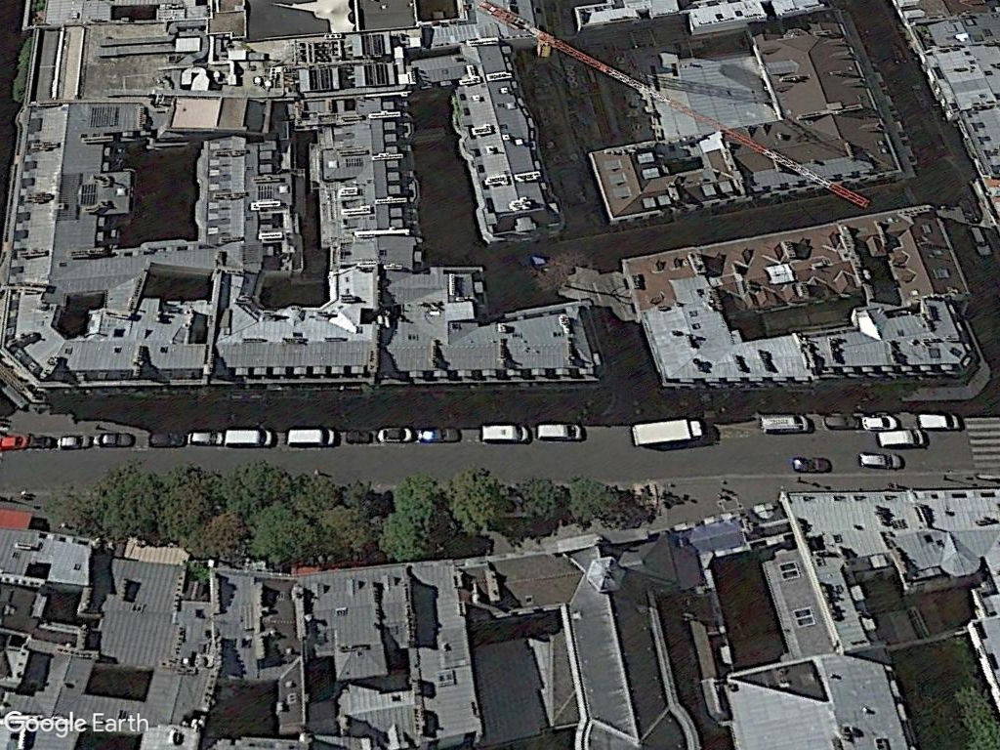

img_size:
(768, 1024, 3)

label:
0 0.394531 0.579427 0.039063 0.023438
0 0.879395 0.561849 0.041992 0.022135
0 0.115723 0.587891 0.045898 0.019531
0 0.074707 0.587891 0.036133 0.022135
0 0.167969 0.584635 0.042969 0.020833
2 0.250488 0.583333 0.053711 0.028646
2 0.312500 0.580729 0.054688 0.028646
0 0.440918 0.579427 0.047852 0.023438
2 0.506348 0.577474 0.055664 0.027344
2 0.560547 0.573568 0.048828 0.024740
1 0.669434 0.578125 0.086914 0.039063
2 0.784180 0.563802 0.056641 0.026042
2 0.938965 0.559896 0.049805 0.028646
0 0.838379 0.561198 0.041992 0.026042
0 0.206055 0.583333 0.042969 0.023438
0 0.358398 0.582031 0.033203 0.023438
0 0.811035 0.618490 0.047852 0.028646
0 0.881348 0.613281 0.051758 0.028646
2 0.895996 0.587240 0.061523 0.033854
0 0.042480 0.587891 0.034180 0.024740
0 0.015625 0.589193 0.033203 0.027344


In [6]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("./datasets/training/0001.jpg")
cv2_imshow(img)
print("img_size:")
print(img.shape)
print()
with open("./datasets/training/0001.txt", "r") as f:
  print("label:")
  print(f.read())

In [ ]:
%%shell
cat > data.yaml << EOF
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: .  # dataset root dir
train: /content/datasets/training  # train images (relative to 'path')
val: /content/datasets/validation  # val images (relative to 'path')
test: /content/datasets/test

nc: 15

# Classes
names:
  0: car
  1: truck
  2: van
  3: longvehicle
  4: bus
  5: airliner
  6: propeller
  7: trainer
  8: chartered
  9: fighter
  10: other
  11: stairtruck
  12: pushbacktruck
  13: helicopter
  14: boat

/bin/bash: line 25: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [ ]:
cat data.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: .  # dataset root dir
train: /content/datasets/training  # train images (relative to 'path')
val: /content/datasets/validation  # val images (relative to 'path')
test: /content/datasets/test

nc: 15

# Classes
names:
  0: car
  1: truck
  2: van
  3: longvehicle
  4: bus
  5: airliner
  6: propeller
  7: trainer
  8: chartered
  9: fighter
  10: other
  11: stairtruck
  12: pushbacktruck
  13: helicopter
  14: boat


In [ ]:
!pip install ultralytics
output.clear()

In [ ]:
from ultralytics import YOLO

model_v8 = YOLO("yolov8n.yaml")
results_v8 = model_v8.train(data="data.yaml", epochs=1, imgsz=1024, rect=True, batch=4)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [ ]:
results_val_v8 = model_v8.val()

Ultralytics YOLOv8.0.122 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3008573 parameters, 0 gradients
val: Scanning /content/datasets/validation.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 250/250 [00:25<00:00,  9.88it/s]
                   all       1000       9726      0.209      0.194    0.00916    0.00297
                   car       1000       4263     0.0622      0.209     0.0453     0.0148
                 truck       1000        545     0.0142      0.365     0.0164    0.00554
                   van       1000       1023      0.017      0.466      0.021    0.00623
           longvehicle       1000        270    0.00359      0.263    0.00278   0.000632
                   bus       1000        411    0.00857      0.231    0.00577    0.00144
              airliner       1000 

In [ ]:
# %tensorboard --logdir runs

In [ ]:
from PIL import Image

# from PIL
im1 = Image.open("datasets/validation/0011.jpg")
results = model_v8.predict(source=im1, save=True)
print(results)
display(Image.open('runs/detect/predict/0011.jpg'))

In [ ]:
%%shell
git clone https://github.com/ultralytics/yolov5
cd yolov5
pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16000, done.
remote: Counting objects: 100% (169/169), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 16000 (delta 103), reused 120 (delta 76), pack-reused 15831
Receiving objects: 100% (16000/16000), 14.65 MiB | 18.52 MiB/s, done.
Resolving deltas: 100% (10972/10972), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.1 MB/s eta 0:00:00


In [ ]:
# ^C out?
import locale

locale.getpreferredencoding = lambda: "UTF-8"
!python /content/yolov5/train.py --img 640 --batch 4 --epochs 1 --data data.yaml --weights yolov5s.pt --rect

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=4, imgsz=640, rect=True, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-186-g0acc5cf Python-3.10.12 torch-2.0.1+cu118 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tr

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir logs
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/exp

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# !ps aux | grep tensorboard
# ! kill #

root       20464  0.9  3.7 2157368 494624 ?      Sl   17:10   0:05 /usr/bin/python3 /usr/local/bin/tensorboard --logdir logs
root       22840  0.0  0.0   6904  3180 ?        S    17:20   0:00 /bin/bash -c ps aux | grep tensorboard
root       22842  0.0  0.0   6444   660 ?        S    17:20   0:00 grep tensorboard


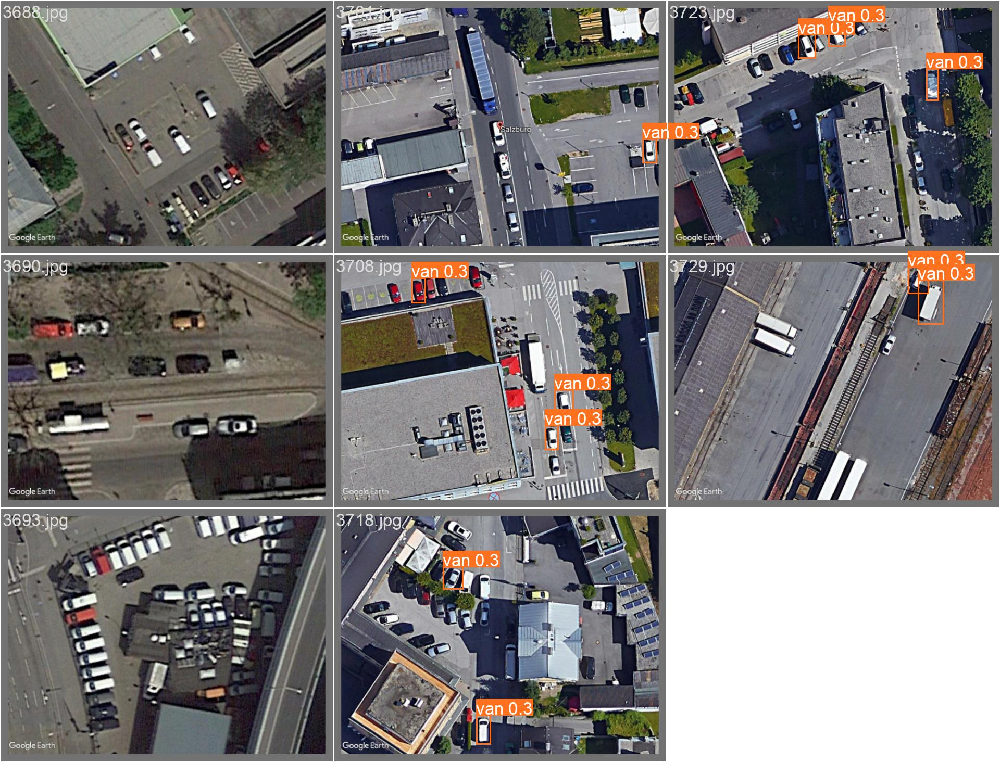

In [ ]:
# filename path needs to be modified: exp > exp2
from IPython.display import Image

Image(filename='/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1000)

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir runs

In [ ]:
# might need modifications
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data /content/data.yaml --img 640 --half

In [ ]:
# --weights path may need to be changed: exp > exp2

test_folder = '/content/datasets/test'
test_sample = random.choice(os.listdir(test_folder))
if test_sample.endswith('.jpg'):
  image_path = os.path.join(test_folder, test_sample)
else:
  test_sample = test_sample[:-4] + '.jpg'
  image_path = os.path.join(test_folder, test_sample)

!python /content/yolov5/detect.py --source {image_path}  --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/test/0535.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/datasets/test/0535.jpg: 480x640 1 airliner, 41.9ms
Speed: 0.5ms pre-process, 41.9ms inference, 1.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp


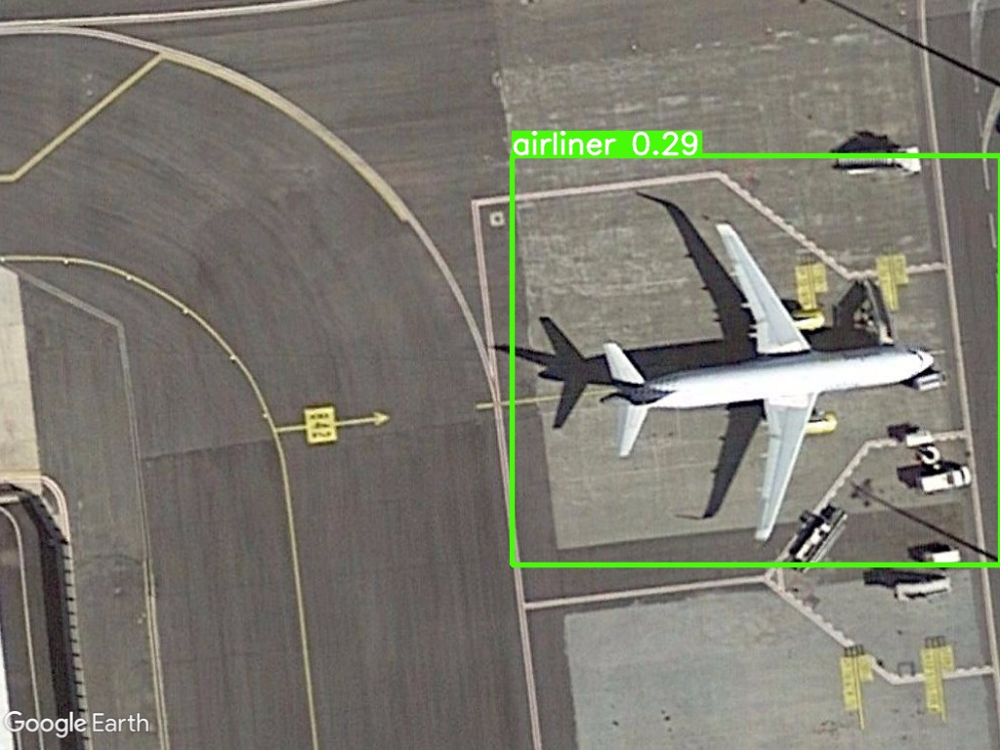

In [ ]:
# filename path needs to be modified

Image(filename=f'/content/yolov5/runs/detect/exp/{test_sample}', width=416)

### yolov6

In [8]:
!git clone https://github.com/meituan/YOLOv6.git
!cd YOLOv6
!pip install -r requirements.txt

output.clear()

In [ ]:
# model = YOLO("yolov6s.yaml")
# model.info()

In [ ]:
# download squeezenet (pytorch's implementation)
# os.chdir('/content')
# !curl -O https://raw.githubusercontent.com/pytorch/vision/main/torchvision/models/squeezenet.py

In [ ]:
# shutil.move('/content/squeezenet.py', '/content/YOLOv6/yolov6/models')

In [ ]:
# !git clone https://github.com/pytorch/vision.git

In [ ]:
# # import modified files to yolov6 > models (yolo_sqz.py) - YOLOv6 > configs (yolov6s_sqz.py and yolov6s_finetune_sqz.py)
# import gdown

# url_1 = 'https://drive.google.com/u/0/uc?id=1cCpZX0Hz1Y-Dll2_dWuNFdCsx1eRLrNU&export=download'
# path_1 = '/content/YOLOv6/yolov6/models/yolo_sqz.py'
# gdown.download(url_1, path_1, quiet=False,fuzzy=True)

# url_2 = 'https://drive.google.com/u/0/uc?id=1LDNMYnYasDRQfBoZTq3m_g2QYAasHmzn&export=download'
# path_2 = '/content/YOLOv6/configs/yolov6s_sqz.py'
# gdown.download(url_2, path_2, quiet=False,fuzzy=True)


# url_3 = 'https://drive.google.com/u/0/uc?id=1pJ_yMVd4w437m5t-SiT5X7QONacP8wfG&export=download'
# path_3 = '/content/YOLOv6/configs/yolov6s_finetune_sqz.py'
# gdown.download(url_3, path_3, quiet=False,fuzzy=True)

# url_4 = 'https://drive.google.com/u/0/uc?id=1cKZ08Wkq1Zrimgyp1MYhJaZtxxYVCf7d&export=download'
# path_4 = '/content/YOLOv6/configs/yolov6s_finetune_base_sqz.py'
# gdown.download(url_4, path_4, quiet=False,fuzzy=True)

# url_5 = 'https://drive.google.com/u/0/uc?id=1qkOV7YA2DofTwK8AWBVEVzBSqbRZHXi2&export=download'
# path_5 = '/content/YOLOv6/yolov6/models/yolo_mobilenet_finetune.py'
# gdown.download(url_5, path_5, quiet=False,fuzzy=True)

In [ ]:
# !cp /content/data.yaml /content/YOLOv6/data.yaml

In [ ]:
# os.chdir('/content/YOLOv6')
# !python tools/train.py --batch 16 --epochs 1 --conf new.yaml --dat/a /content/YOLOv6/data.yaml --weights '' --fuse_ab --device 0
# !python tools/train.py --batch 16 --epochs 1 --conf configs/yolov6s_finetune_sqz.py --data /content/YOLOv6/data.yaml --fuse_ab --device 0

In [ ]:
# !python tools/train.py --batch 16 --epochs 1 --conf new.yaml --dat/a /content/YOLOv6/data.yaml --weights '' --fuse_ab --device 0
# !python tools/train.py --batch 16 --epochs 1 --conf configs/yolo_mobilenet_finetune.py --data /content/YOLOv6/data.yaml --fuse_ab --device 0

In [ ]:
# os.chdir('/content/')

In [9]:
!mkdir custom_dataset
!mkdir custom_dataset/image
!mkdir custom_dataset/label
!mkdir custom_dataset/image/train
!mkdir custom_dataset/image/val
!mkdir custom_dataset/image/test
!mkdir custom_dataset/label/train
!mkdir custom_dataset/label/val
!mkdir custom_dataset/label/test

In [10]:
!cp datasets/training/*.jpg custom_dataset/image/train
!cp datasets/training/*.txt custom_dataset/label/train
!cp datasets/validation/*.jpg custom_dataset/image/val
!cp datasets/validation/*.txt custom_dataset/label/val
!cp datasets/test/*.jpg custom_dataset/image/test
!cp datasets/test/*.txt custom_dataset/label/test

In [11]:
%%shell
cat > data_2.yaml << EOF
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
train: ../custom_dataset/images/train # train images
val: ../custom_dataset/images/val # val images
test: ../custom_dataset/images/test

is_coco: False

nc: 15

# Classes
names:
  0: car
  1: truck
  2: van
  3: longvehicle
  4: bus
  5: airliner
  6: propeller
  7: trainer
  8: chartered
  9: fighter
  10: other
  11: stairtruck
  12: pushbacktruck
  13: helicopter
  14: boat

/bin/bash: line 26: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [12]:
os.chdir('/content/YOLOv6')

In [ ]:
# P5 models
# !python tools/train.py --batch 32 --conf configs/yolov6s_finetune.py --data /content/data_2.yaml --fuse_ab --device 0

In [13]:
# Checking the output of EfficientRep in each layer
import torch
from yolov6.models.efficientrep import EfficientRep
from yolov6.models.yolo import make_divisible

# from configs/yolov6s_finetune.py
depth_mul=0.33
width_mul=0.50

num_repeat_backbone=[1, 6, 12, 18, 6]
num_repeat_neck=[12, 12, 12, 12]

channels_list_backbone=[64, 128, 256, 512, 1024]
channels_list_neck=[256, 128, 128, 256, 256, 512]

#from yolov6/models/yolo.py
num_repeat = [(max(round(i * depth_mul), 1) if i > 1 else i) for i in (num_repeat_backbone + num_repeat_neck)]
channels_list = [make_divisible(i * width_mul, 8) for i in (channels_list_backbone + channels_list_neck)]

backbone_model = EfficientRep(
                 num_repeats=num_repeat,
                 channels_list=channels_list,
                 fuse_P2=True,
                 cspsppf=True)

random_img = torch.randn(2, 3, 640, 640)

img = random_img
for name, layer in backbone_model.named_children():
  print(f'name: {name}')
  img = layer(img)
  print(f'output shape: {img.shape}')

name: stem
output shape: torch.Size([2, 32, 320, 320])
name: ERBlock_2
output shape: torch.Size([2, 64, 160, 160])
name: ERBlock_3
output shape: torch.Size([2, 128, 80, 80])
name: ERBlock_4
output shape: torch.Size([2, 256, 40, 40])
name: ERBlock_5
output shape: torch.Size([2, 512, 20, 20])


In [14]:
img_2 = random_img
features = backbone_model(img_2)

for phase, f in enumerate(features):
  print(f'phase: {phase}')
  print(f'output shape: {f.shape}')

phase: 0
output shape: torch.Size([2, 64, 160, 160])
phase: 1
output shape: torch.Size([2, 128, 80, 80])
phase: 2
output shape: torch.Size([2, 256, 40, 40])
phase: 3
output shape: torch.Size([2, 512, 20, 20])


In [15]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'squeezenet1_0', pretrained=True)
# model.eval()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/squeezenet1_0-b66bff10.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_0-b66bff10.pth
100%|██████████| 4.78M/4.78M [00:00<00:00, 211MB/s]


# Building a customized backbone architecture based on SqueezeNet1_0

In [17]:
# self._b_list: we have omitted layer no#7 because the neck network only accepts 4 inputs
import torch.nn as nn

class SqueezeNet(nn.Module):
  def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
    super().__init__()
    self._b = model.features
    # ReLU activated layers
    self._b_list = [1, 4, 7, 12]

  def forward(self, x):
    output = []
    for num, layer in enumerate(self._b):
      x = layer(x)
      if num in self._b_list:
        output.append(x)
    return tuple(output)

In [18]:
s = SqueezeNet()

img_3 = random_img
for phase, layer in enumerate(s._b):
  print(f'phase: {phase}')
  img_3 = layer(img_3)
  print(f'output shape: {img_3.shape}')

phase: 0
output shape: torch.Size([2, 96, 317, 317])
phase: 1
output shape: torch.Size([2, 96, 317, 317])
phase: 2
output shape: torch.Size([2, 96, 158, 158])
phase: 3
output shape: torch.Size([2, 128, 158, 158])
phase: 4
output shape: torch.Size([2, 128, 158, 158])
phase: 5
output shape: torch.Size([2, 256, 158, 158])
phase: 6
output shape: torch.Size([2, 256, 79, 79])
phase: 7
output shape: torch.Size([2, 256, 79, 79])
phase: 8
output shape: torch.Size([2, 384, 79, 79])
phase: 9
output shape: torch.Size([2, 384, 79, 79])
phase: 10
output shape: torch.Size([2, 512, 79, 79])
phase: 11
output shape: torch.Size([2, 512, 39, 39])
phase: 12
output shape: torch.Size([2, 512, 39, 39])


In [21]:
img_4 = random_img
features = s(img_4)

for name, f in enumerate(features):
  print(f'name: {name}')
  print(f'output shape: {f.shape}')

print('\n')
'''
number of channels for EfficientRep: 64, 128, 256, 512
number of channels for SqueezeNet: 96, 128, 256, 384, 512

feature size for EfficientRep:  160 * 160
                                 80 * 80
                                 40 * 40
                                 20 * 20

feature size for SqueezeNet:    317 * 317
                                158 * 158
                                 79 * 79
                                 79 * 79
                                 39 * 39
'''

name: 0
output shape: torch.Size([2, 96, 317, 317])
name: 1
output shape: torch.Size([2, 128, 158, 158])
name: 2
output shape: torch.Size([2, 256, 79, 79])
name: 3
output shape: torch.Size([2, 512, 39, 39])




'\nnumber of channels for EfficientRep: 64, 128, 256, 512\nnumber of channels for SqueezeNet: 96, 128, 256, 384, 512\n\nfeature size for EfficientRep:  160 * 160\n                                 80 * 80\n                                 40 * 40\n                                 20 * 20\n\nfeature size for SqueezeNet:  317 * 317\n                                158 * 158\n                                 79 * 79\n                                 79 * 79\n                                 39 * 39\n'

# Checking the output of RepBiFPANNeck (neck) in each layer

In [22]:
from yolov6.models.reppan import RepBiFPANNeck

depth_mul=0.33
width_mul=0.50

num_repeat_backbone=[1, 6, 12, 18, 6]
num_repeat_neck=[12, 12, 12, 12]

# we must change channels_list_backbone: 64 -> 96
channels_list_backbone=[96, 128, 256, 512, 1024]
channels_list_neck=[256, 128, 128, 256, 256, 512]

num_repeat = [(max(round(i * depth_mul), 1) if i > 1 else i) for i in (num_repeat_backbone + num_repeat_neck)]
channels_list = [make_divisible(i * width_mul, 8) for i in (channels_list_backbone + channels_list_neck)]


img_4 = random_img

neck = RepBiFPANNeck(channels_list=channels_list, num_repeats=num_repeat)
backbone = s(img_4)

for feature in backbone:
  print(feature.shape)

torch.Size([2, 96, 317, 317])
torch.Size([2, 128, 158, 158])
torch.Size([2, 256, 79, 79])
torch.Size([2, 512, 39, 39])


# configuring the inputs and outputs of the NECK in order to be compatible with the new backbone

In [25]:
from torch.nn.functional import interpolate
(x3, x2, x1, x0) = backbone

print('Input shapes:\n')
print(x0.shape)
print(x1.shape)
print(x2.shape)
print(x3.shape)

'''
Arithmetic operations required to match the dimension of features:
x0:  [2, 512, 39, 39] -> [2, 512, 40, 40]
x1:  [2, 256, 79, 79] -> [2, 256, 80, 80]
x2:  [2, 128, 158, 158] -> [2, 128, 160, 160]
x3:  [2, 96, 317, 317] -> [2, 96, 320, 320]

'''

# Resize x0 to [2, 512, 40, 40]
x0_resized = interpolate(x0, size=(40, 40), mode='bilinear', align_corners=True)

# Resize x1 to [2, 256, 80, 80]
x1_resized = interpolate(x1, size=(80, 80), mode='bilinear', align_corners=True)

# Resize x2 to [2, 128, 160, 160]
x2_resized = interpolate(x2, size=(160, 160), mode='bilinear', align_corners=True)

# Resize x3 to [2, 96, 320, 320]
x3_resized = interpolate(x3, size=(320, 320), mode='bilinear', align_corners=True)


conv = nn.Conv2d(in_channels=96, out_channels=64, kernel_size=1)
x3_reduced = conv(x3_resized)

print('\nFeature shape in each layer:\n')
fpn_out0 = neck.reduce_layer0(x0_resized)
print(fpn_out0.shape)

f_concat_layer0 = neck.Bifusion0([fpn_out0, x1_resized, x2_resized])
print(f_concat_layer0.shape)

f_out0 = neck.Rep_p4(f_concat_layer0)
print(f_out0.shape)

fpn_out1 = neck.reduce_layer1(f_out0)
print(fpn_out1.shape)

f_concat_layer1 = neck.Bifusion1([fpn_out1, x2_resized, x3_reduced])
print(f_concat_layer1.shape)

pan_out2 = neck.Rep_p3(f_concat_layer1)
print(pan_out2.shape)

down_feat1 = neck.downsample2(pan_out2)
print(down_feat1.shape)

p_concat_layer1 = torch.cat([down_feat1, fpn_out1], 1)
print(p_concat_layer1.shape)

pan_out1 = neck.Rep_n3(p_concat_layer1)
print(pan_out1.shape)

down_feat0 = neck.downsample1(pan_out1)
print(down_feat0.shape)

p_concat_layer2 = torch.cat([down_feat0, fpn_out0], 1)
print(p_concat_layer2.shape)

pan_out0 = neck.Rep_n4(p_concat_layer2)
print(pan_out0.shape)

outputs = [pan_out2, pan_out1, pan_out0]


Input shapes:

torch.Size([2, 512, 39, 39])
torch.Size([2, 256, 79, 79])
torch.Size([2, 128, 158, 158])
torch.Size([2, 96, 317, 317])

Feature shape in each layer:

torch.Size([2, 128, 40, 40])
torch.Size([2, 128, 80, 80])
torch.Size([2, 128, 80, 80])
torch.Size([2, 64, 80, 80])
torch.Size([2, 64, 160, 160])
torch.Size([2, 64, 160, 160])
torch.Size([2, 64, 80, 80])
torch.Size([2, 128, 80, 80])
torch.Size([2, 128, 80, 80])
torch.Size([2, 128, 40, 40])
torch.Size([2, 256, 40, 40])
torch.Size([2, 256, 40, 40])


In [28]:
print(pan_out2.shape)
print(pan_out1.shape)
print(pan_out0.shape)

torch.Size([2, 64, 160, 160])
torch.Size([2, 128, 80, 80])
torch.Size([2, 256, 40, 40])


# configuring the inputs and outputs of the HEAD in order to be compatible with the new backbone and neck architecture.

In [49]:
# from yolov6.models.effidehead import build_effidehead_layer

# img_5 = torch.randn(2, 64, 640, 640)

# head_layers = build_effidehead_layer(channels_list, 1, 64)
# for name, layer in enumerate(head_layers):
#   print(name)
#   # print(layer)
#   x = layer(output)
#   print(x.shape)


# Making the config.py file

In [51]:
%%shell
cat > /content/YOLOv6/yolov6/models/squeezenet.py << EOF
import torch.nn as nn

class SqueezeNet(nn.Module):
  def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
    super().__init__()
    self._b = model.features
    # ReLU activated layers
    self._b_list = [1, 4, 7, 12]

  def forward(self, x):
    output = []
    for num, layer in enumerate(self._b):
      x = layer(x)
      if num in self._b_list:
        output.append(x)
    return tuple(output)

/bin/bash: line 23: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [53]:
!echo 'from yolov6.models.squeezenet import *' >> /content/YOLOv6/yolov6/models/yolo.py
!echo 'from yolov6.models.squeezenet import *' >> /content/YOLOv6/yolov6/models/yolo_lite.py

In [54]:
%%shell
cat > /content/YOLOv6/configs/yolov6s_finetune_sqz.py << EOF
# YOLOv6s model
model = dict(
    type='YOLOv6s',
    pretrained='weights/yolov6s.pt',
    depth_multiple=0.33,
    width_multiple=0.50,
    backbone=dict(
        type='SqueezeNet',
        num_repeats=[1, 6, 12, 18, 6],
        out_channels=[96, 128, 256, 512, 1024],
        fuse_P2=True,
        cspsppf=True,
        ),
    neck=dict(
        type='RepBiFPANNeck',
        num_repeats=[12, 12, 12, 12],
        out_channels=[256, 128, 128, 256, 256, 512],
        ),
    head=dict(
        type='EffiDeHead',
        in_channels=[128, 256, 512],
        num_layers=3,
        begin_indices=24,
        anchors=3,
        anchors_init=[[10,13, 19,19, 33,23],
                      [30,61, 59,59, 59,119],
                      [116,90, 185,185, 373,326]],
        out_indices=[17, 20, 23],
        strides=[8, 16, 32],
        atss_warmup_epoch=0,
        iou_type='giou',
        use_dfl=False, # set to True if you want to further train with distillation
        reg_max=0, # set to 16 if you want to further train with distillation
        distill_weight={
            'class': 1.0,
            'dfl': 1.0,
        },
    )
)

solver = dict(
    optim='SGD',
    lr_scheduler='Cosine',
    lr0=0.0032,
    lrf=0.12,
    momentum=0.843,
    weight_decay=0.00036,
    warmup_epochs=2.0,
    warmup_momentum=0.5,
    warmup_bias_lr=0.05
)

data_aug = dict(
    hsv_h=0.0138,
    hsv_s=0.664,
    hsv_v=0.464,
    degrees=0.373,
    translate=0.245,
    scale=0.898,
    shear=0.602,
    flipud=0.00856,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.243,
)


/bin/bash: line 65: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [57]:
!pip install addict

In [58]:
!python tools/train.py --batch 32 --conf configs/yolov6s_finetune_sqz.py --data /content/data_2.yaml --img 610 --rec

2023-07-01 22:21:23.587346: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-01 22:21:24.785220: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
--img-size 610 must be multiple of max stride 32, updating to 640
Traceback (most recent call last):
  File "/content/YOLOv6/tools/train.py", line 142, in <module>
    main(args)
  File "/content/YOLOv6/tools/train.py", line 115, in main
    cfg, device, args = check_and_init(args)
  File "/content/YOLOv6/tools/train.py", line 101, in check_and_init
    device = select_device(args.device)
  File "/content/YOLOv6/yolov6/utils/envs.py", line 32, in select_device
    assert torch.cuda.is_available()
AssertionError
